In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


noc_region_df = pd.read_csv('../Data/noc_regions.csv')
athlete_events_df = pd.read_csv('../Data/athlete_events.csv')

merged_df = pd.merge(athlete_events_df, noc_region_df, how='inner', on='NOC')

In [2]:
# a. hur många länder som är med i datan?
num_countries = merged_df['region'].nunique()
print(f'a. total countries in the dataset: {num_countries}')

a. total countries in the dataset: 205


In [3]:
# b. Vilka länder är med?
countries = merged_df['region'].unique()
print(f'b. Vilka länder är med? {countries}')

b. Vilka länder är med? ['China' 'Denmark' 'Netherlands' 'USA' 'Finland' 'Norway' 'Romania'
 'Estonia' 'France' 'Morocco' 'Spain' 'Egypt' 'Iran' 'Bulgaria' 'Italy'
 'Chad' 'Azerbaijan' 'Sudan' 'Russia' 'Argentina' 'Cuba' 'Belarus'
 'Greece' 'Cameroon' 'Turkey' 'Chile' 'Mexico' 'Nicaragua' 'Hungary'
 'Nigeria' 'Algeria' 'Kuwait' 'Bahrain' 'Pakistan' 'Iraq' 'Syria'
 'Lebanon' 'Qatar' 'Malaysia' 'Germany' 'Canada' 'Ireland' 'Australia'
 'South Africa' 'Eritrea' 'Tanzania' 'Jordan' 'Tunisia' 'Libya' 'Belgium'
 'Djibouti' 'Palestine' 'Comoros' 'Kazakhstan' 'Brunei' 'India'
 'Saudi Arabia' 'Maldives' 'Ethiopia' 'United Arab Emirates' 'Yemen'
 'Indonesia' 'Philippines' 'Uzbekistan' 'Kyrgyzstan' 'Tajikistan' 'Japan'
 'Republic of Congo' 'Switzerland' 'Brazil' 'Monaco' 'Israel' 'Uruguay'
 'Sweden' 'Virgin Islands, US' 'Sri Lanka' 'Armenia' 'Ivory Coast' 'Kenya'
 'Benin' 'Ukraine' 'UK' 'Ghana' 'Somalia' 'Latvia' 'Niger' 'Mali'
 'Afghanistan' 'Poland' 'Costa Rica' 'Panama' 'Georgia' 'Slovenia'
 '

In [4]:
# c. Vilka sporter är med?
sports = merged_df['Sport'].unique()
print(f'c. Vilka sporter är med? {sports}')

c. Vilka sporter är med? ['Basketball' 'Judo' 'Boxing' 'Wrestling' 'Swimming' 'Speed Skating'
 'Short Track Speed Skating' 'Softball' 'Hockey' 'Curling' 'Archery'
 'Triathlon' 'Football' 'Rhythmic Gymnastics' 'Athletics' 'Badminton'
 'Fencing' 'Figure Skating' 'Gymnastics' 'Volleyball' 'Baseball'
 'Water Polo' 'Snowboarding' 'Shooting' 'Weightlifting' 'Cycling' 'Rowing'
 'Sailing' 'Diving' 'Modern Pentathlon' 'Art Competitions'
 'Synchronized Swimming' 'Handball' 'Canoeing' 'Cross Country Skiing'
 'Table Tennis' 'Ice Hockey' 'Tennis' 'Taekwondo' 'Freestyle Skiing'
 'Beach Volleyball' 'Trampolining' 'Alpine Skiing' 'Golf' 'Biathlon'
 'Equestrianism' 'Ski Jumping' 'Tug-Of-War' 'Bobsleigh' 'Nordic Combined'
 'Polo' 'Skeleton' 'Rugby Sevens' 'Luge' 'Roque' 'Rugby' 'Lacrosse'
 'Jeu De Paume' 'Military Ski Patrol' 'Cricket' 'Croquet' 'Motorboating'
 'Basque Pelota' 'Alpinism' 'Aeronautics' 'Racquets']


In [5]:
# d. Vilka medaljtyper finns det?
medal_types = merged_df['Medal'].dropna().unique()
print(f'd. Vilka medaljtyper finns det? {medal_types}')

d. Vilka medaljtyper finns det? ['Silver' 'Bronze' 'Gold']


In [6]:
# e. Statistik för åldern
age_stats = merged_df['Age'].describe()
print(f'e. Statistik för åldern:\n{age_stats}')

e. Statistik för åldern:
count    261305.000000
mean         25.559783
std           6.392501
min          10.000000
25%          21.000000
50%          24.000000
75%          28.000000
max          97.000000
Name: Age, dtype: float64


In [7]:
# f) Åldersfördelning inom varje sport
fig = px.box(merged_df, x='Sport', y='Age', title='Åldersfördelning inom varje sport')
fig.update_layout(xaxis=dict(tickangle=90))
fig.show()

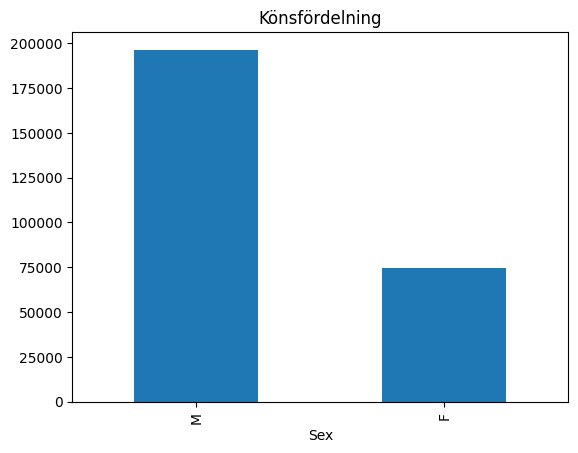

In [8]:
# g. Diagram över könsfördelningen
gender_distribution = merged_df['Sex'].value_counts()
gender_distribution.plot(kind='bar', title='Könsfördelning')
plt.show()

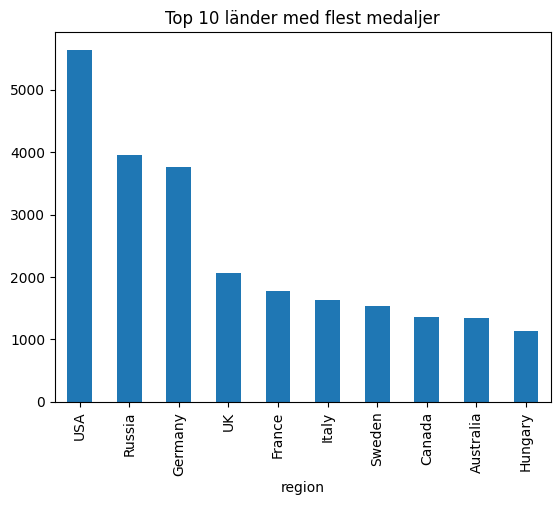

In [9]:
# h. Diagram över topp 10 länder som tagit flest medaljer
top_countries = merged_df.groupby('region')['Medal'].count().sort_values(ascending=False).head(10)
top_countries.plot(kind='bar', title='Top 10 länder med flest medaljer')
plt.show()

In [10]:
# i) The progression of how many female olympic sports participants there are over the years
women_df = merged_df[merged_df['Sex'] == 'F']

# Count the number of women in each year
women_per_year = women_df.groupby('Year').size().reset_index(name='Number of Women')

# Create an interactive bar graph using Plotly Express
fig = px.bar(women_per_year, x='Year', y='Number of Women', title='Number of Women in Each Year of the Olympics',
             labels={'Number of Women': 'Number of Women', 'Year': 'Year'})

fig.show()

In [11]:
# i) The progression of how many female olympic sports participants there are over the years and seasons

women_summer_df = merged_df[(merged_df['Sex'] == 'F') & (merged_df['Season'] == 'Summer')]

# Count the number of women in each year for Summer Olympics
women_summer_per_year = women_summer_df.groupby('Year').size().reset_index(name='Number of Women')

women_winter_df = merged_df[(merged_df['Sex'] == 'F') & (merged_df['Season'] == 'Winter')]

# Count the number of women in each year for Winter Olympics
women_winter_per_year = women_winter_df.groupby('Year').size().reset_index(name='Number of Women')

fig_summer = px.bar(women_summer_per_year, x='Year', y='Number of Women',
                    title='Number of Women in Each Year of the Summer Olympics',
                    labels={'Number of Women': 'Number of Women', 'Year': 'Year'})

fig_winter = px.bar(women_winter_per_year, x='Year', y='Number of Women',
                    title='Number of Women in Each Year of the Winter Olympics',
                    labels={'Number of Women': 'Number of Women', 'Year': 'Year'})

# Show the interactive graphs
fig_summer.show()
fig_winter.show()   

In [12]:
#  Uppgift 1 ) Anonymisera kolumnen med idrottarnas namn med hashfunktionen SHA-256.

import hashlib as hl
print(merged_df['Name'])
def hash_name(name):
    return hl.sha256(name.encode()).hexdigest()
merged_df['hashed_Name'] = merged_df['Name'].apply(hash_name)
print(merged_df['hashed_Name'])

0                  A Dijiang
1                   A Lamusi
2              Abudoureheman
3                  Ai Linuer
4                  Ai Yanhan
                 ...        
270762       Mamorallo Tjoka
270763       Mamorallo Tjoka
270764    M'apotlaki Ts'elho
270765            Lefa Tsapi
270766         Mosolesa Tsie
Name: Name, Length: 270767, dtype: object
0         3a4eef48434c66b3f14ab0221f6762d0ef7c6135ab2790...
1         a6430cc6630934275dc6283f7e97e9625e6587cdddec7a...
2         1b3608c7e8006309deaeae26a9b7461b0d92f4c26b98ad...
3         f941f6fbfcf284d4a16b4e1b2513ddab5c0e48138f871e...
4         b83a05b6351ae6d539094448c89c6e68c94af8ca0635d6...
                                ...                        
270762    36531c238e3d1db3d1fb45af9b349f490ef97fe93db21c...
270763    36531c238e3d1db3d1fb45af9b349f490ef97fe93db21c...
270764    c0e689e1bac2a68712990e31a24ea7d074126e2e6b0169...
270765    0a1bedbfbc053854ab7470a7ab78913fb4cd7d6f73dd3e...
270766    197195dcd1fb7d490a4238db4da42

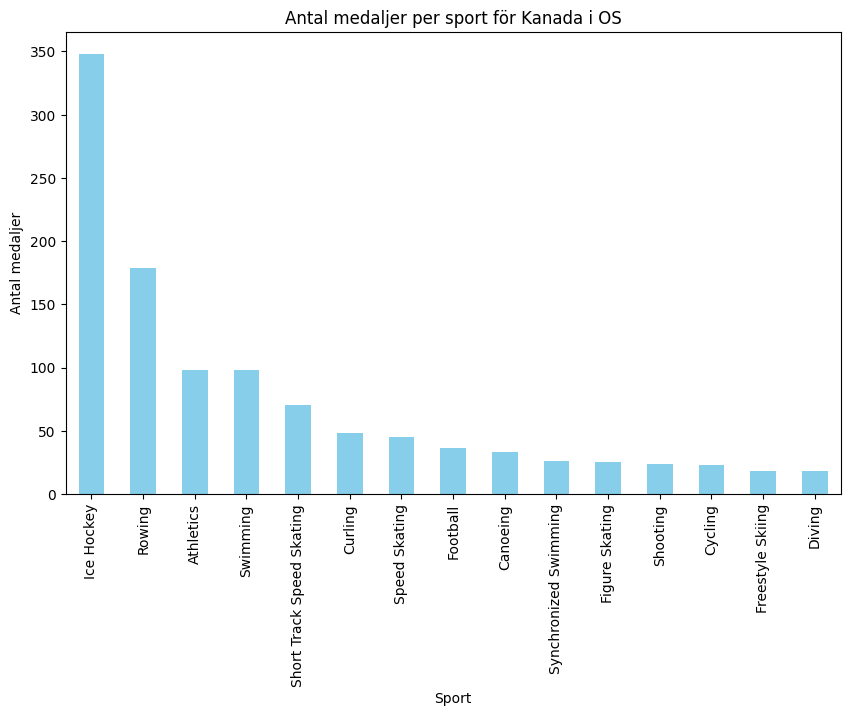

In [13]:
# Uppgift 1 ) De sporter som Kanada fått flest medaljer i.

df_canada = merged_df[merged_df['Team'] == 'Canada']
canada_sport_medals = df_canada.groupby('Sport')['Medal'].count().sort_values(ascending=False).head(15)

plt.figure(figsize=(10, 6))
canada_sport_medals.plot(kind='bar', color='skyblue')
plt.title('Antal medaljer per sport för Kanada i OS')
plt.xlabel('Sport')
plt.ylabel('Antal medaljer')
plt.show()

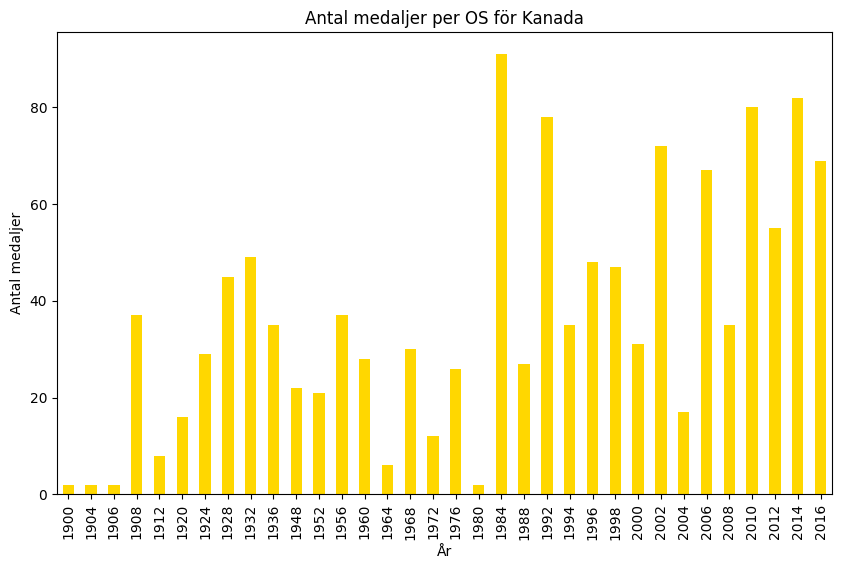

In [14]:
# Uppgift 1 ) Antal medaljer per OS för Kanada.
medals_per_os = df_canada.groupby('Year')['Medal'].count()

plt.figure(figsize=(10, 6))
medals_per_os.plot(kind='bar', color='gold')
plt.title('Antal medaljer per OS för Kanada')
plt.xlabel('År')
plt.ylabel('Antal medaljer')
plt.show()

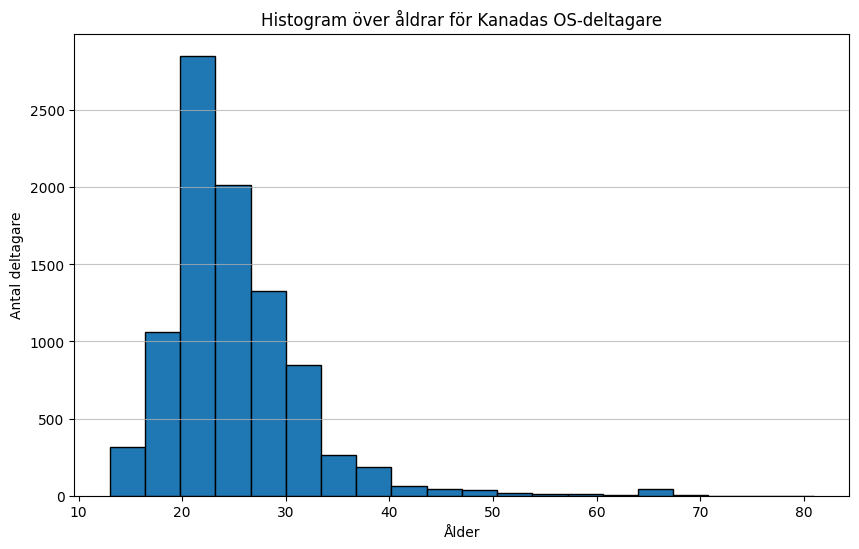

In [15]:
# Uppgift 1 ) Histogram över åldrar för Kanadas OS-deltagare.
plt.figure(figsize=(10, 6))
plt.hist(df_canada['Age'].dropna(), bins=20, edgecolor='black')
plt.title('Histogram över åldrar för Kanadas OS-deltagare')
plt.xlabel('Ålder')
plt.ylabel('Antal deltagare')
plt.grid(axis='y', alpha=0.75)
plt.show()

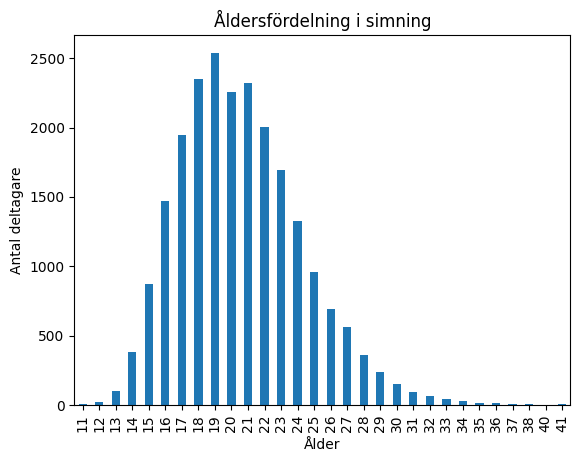

In [16]:
# Uppgift 2 ) Simmning: Åldersfördelning.
swimming_age = merged_df[merged_df['Sport'] == 'Swimming']['Age'].value_counts().head(30)
swimming_age.index = swimming_age.index.astype(int)
swimming_age = swimming_age.astype(int)
swimming_age = swimming_age.sort_index()
swimming_age.plot(kind='bar', title='Åldersfördelning i simning')
plt.xlabel('Ålder')
plt.ylabel('Antal deltagare')
plt.show()

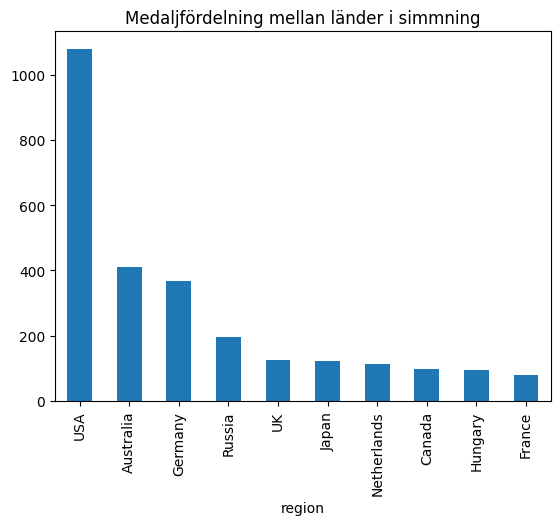

In [17]:
# Uppgift 2 ) Simmning: Medaljfördelning mellan länder.
swimming_medal = merged_df[merged_df['Sport'] == 'Swimming'].groupby('region')['Medal'].count().sort_values(ascending=False).head(10)
swimming_medal.plot(kind='bar', title='Medaljfördelning mellan länder i simmning')
plt.show()